Link to [Skybee Routes](https://skybee-routes.onrender.com/)

This analysis uses the [Airline Routes & Airports dataset](https://www.kaggle.com/datasets/moonnectar/airline-routes-92k-and-airports-10k-dataset) from Kaggle, containing **92k airline routes** and **10k airports** worldwide.


In [1]:
import numpy as np
import pandas as pd
import random
import time
import os
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import networkx as nx
import plotly.graph_objects as go
import plotly.express as px
from networkx.algorithms import community
from tqdm import tqdm

warnings.filterwarnings('ignore')
plt.style.use("seaborn-v0_8")
sns.set_theme()

### Importing Libraries

In this cell, we import various Python libraries necessary for data analysis and visualization:
- `numpy` and `pandas` for numerical and tabular data manipulation.
- `matplotlib`, `seaborn`, and `plotly` for plotting and interactive charts.
- `networkx` for creating and analyzing networks of airports.
- Warnings are suppressed to ensure a clean output.


In [2]:
path = "data/Airports.csv"
airports = pd.read_csv(path)
airports.head()

,Label,ID,Latitude,Longitude
0,Goroka Airport,GKA,-6.081690,145.391998
1,Madang Airport,MAG,-5.207080,145.789002
2,Mount Hagen Kagamuga Airport,HGU,-5.826790,144.296005
3,Nadzab Airport,LAE,-6.569803,146.725977
4,Port Moresby Jacksons International Airport,POM,-9.443380,147.220001


In [3]:
path = "data/Routes.csv"
routes = pd.read_csv(path)
routes.head()

,Airline ID,Departure,Destination
0,2B,AER,KZN
1,2B,ASF,KZN
2,2B,ASF,MRV
3,2B,CEK,KZN
4,2B,CEK,OVB


In [4]:
print(f"The shape of airports: {airports.shape}")
print(f"The shape of routes: {routes.shape}")

The shape of airports: (9075, 4)
The shape of routes: (92695, 3)


In [5]:
nan = airports.isnull().sum().sum()/len(airports)
print(f"Percentage of missing values: {nan:.2%}")

Percentage of missing values: 0.00%


In [6]:
nan = routes.isnull().sum().sum()/len(routes)
print(f"Percentage of missing values: {nan:.2%}")

Percentage of missing values: 0.01%


In [7]:
routes = routes.dropna()
nan = routes.isnull().sum().sum()/len(routes)
print(f"Percentage of missing values: {nan:.2%}")

Percentage of missing values: 0.00%


### Loading Dataset Files

This cell loads the airport and route datasets from CSV files into Pandas DataFrames.
- The `airports` dataset contains information like location, ID, and airport name.
- The `routes` dataset contains connections between airports, indicating how they are linked by flights.
This is the foundational data for the entire analysis.


In [8]:
traffic = routes.groupby('Airline ID').size().reset_index(name='Frequency').sort_values(by='Frequency', ascending=False).reset_index(drop=True)
traffic

,Airline ID,Frequency
0,FR,3169
1,AA,3005
2,UA,2616
3,DL,2318
4,MU,2258
...,...,...
731,F6,1
732,AG,1
733,CT,1
734,TEZ,1


### Calculating Airline Traffic Frequency

Here, we count how many routes each airline operates and store the result in the `traffic` DataFrame.
This gives us an overview of which airlines are most active in the global network, which can highlight major players in air transportation.


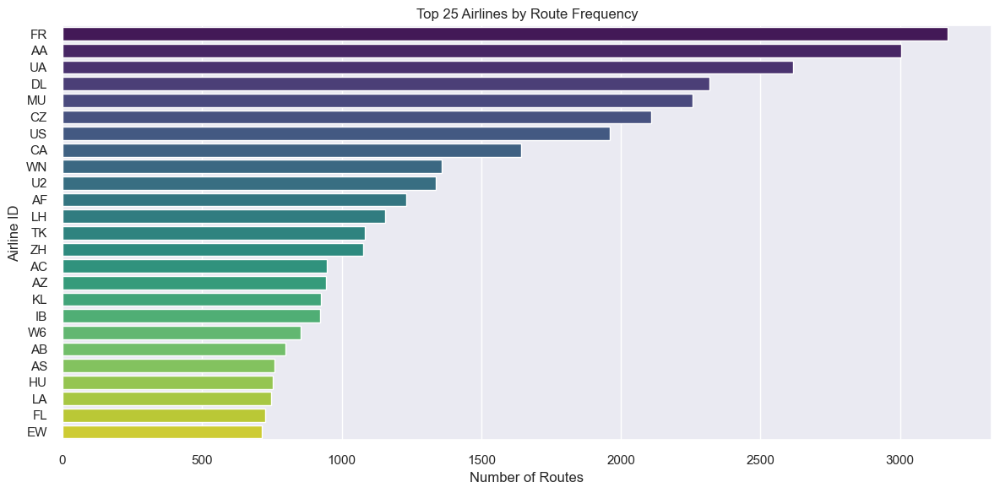

In [9]:
plt.figure(figsize=(12, 6))
top = traffic.head(25)
sns.barplot(x='Frequency', y='Airline ID', data=top, palette='viridis')

plt.title("Top 25 Airlines by Route Frequency")
plt.xlabel("Number of Routes")
plt.ylabel("Airline ID")
plt.tight_layout()
plt.show()

### Visualizing Airline Traffic

This cell creates a bar chart showing the top airlines by route frequency.
The chart makes it easy to see which airlines dominate the global air traffic network and how traffic is distributed among various carriers.


In [10]:
df = airports

fig = px.scatter_geo(df,
                     lat='Latitude',
                     lon='Longitude',
                     hover_name='Label',
                     hover_data=['ID'],
                     title="World Map of Airports",
                     projection="natural earth")

fig.update_traces(marker=dict(size=5, color='blue', line=dict(width=0)))

fig.update_layout(
    geo=dict(
        showland=True,
        landcolor="rgb(217, 217, 217)",
        showcountries=True,
        countrycolor="rgb(204, 204, 204)"
    ),
    template="plotly_white"
)

fig.show()


### Mapping Airports Geographically

Using Plotly's map features, this cell visualizes all airports on a global map.
It allows us to understand the spatial distribution of airports and identify regions with a high concentration of flight activity.


In [11]:
# Haversine formula to calculate distance
def haversine(lat1, lon1, lat2, lon2):
    R = 6371.0  # Earth radius in kilometers
    lat1_rad = np.radians(lat1)
    lon1_rad = np.radians(lon1)
    lat2_rad = np.radians(lat2)
    lon2_rad = np.radians(lon2)

    dlat = lat2_rad - lat1_rad
    dlon = lon2_rad - lon1_rad

    a = np.sin(dlat / 2)**2 + np.cos(lat1_rad) * np.cos(lat2_rad) * np.sin(dlon / 2)**2
    c = 2 * np.arcsin(np.sqrt(a))

    distance = R * c
    return distance

routes = routes.merge(
    airports.add_prefix('Departure_'),
    left_on='Departure',
    right_on='Departure_ID',
    how='left'
)

routes = routes.merge(
    airports.add_prefix('Destination_'),
    left_on='Destination',
    right_on='Destination_ID',
    how='left'
)

routes['Distance_km'] = haversine(
    routes['Departure_Latitude'],
    routes['Departure_Longitude'],
    routes['Destination_Latitude'],
    routes['Destination_Longitude']
)

print(routes.head(3))

  Airline ID Departure Destination              Departure_Label Departure_ID  \
0         2B       AER         KZN  Sochi International Airport          AER   
1         2B       ASF         KZN            Astrakhan Airport          ASF   
2         2B       ASF         MRV            Astrakhan Airport          ASF   

   Departure_Latitude  Departure_Longitude            Destination_Label  \
0           43.449902            39.956600  Kazan International Airport   
1           46.283298            48.006302  Kazan International Airport   
2           46.283298            48.006302     Mineralnyye Vody Airport   

  Destination_ID  Destination_Latitude  Destination_Longitude  Distance_km  
0            KZN             55.606201              49.278702  1506.825604  
1            KZN             55.606201              49.278702  1040.438320  
2            MRV             44.225101              43.081902   448.164909  


### Calculating Geographic Distances

This cell defines the Haversine formula to calculate the great-circle distance between two points on Earth using latitude and longitude.
This formula is used to compute the distance between airports, which is essential for route analysis and optimization.


### Adding Location Data to Routes

Here, we enrich the `routes` dataset by merging latitude and longitude information from the `airports` dataset for both departure and destination airports.
This prepares the data for calculating distances and visualizing routes geographically.


### Adding Route Distances

This cell calculates the distance between airports using the Haversine formula and stores it as a new column `Distance_km`.
These distances help us analyze patterns such as flight length distribution and optimize travel paths.


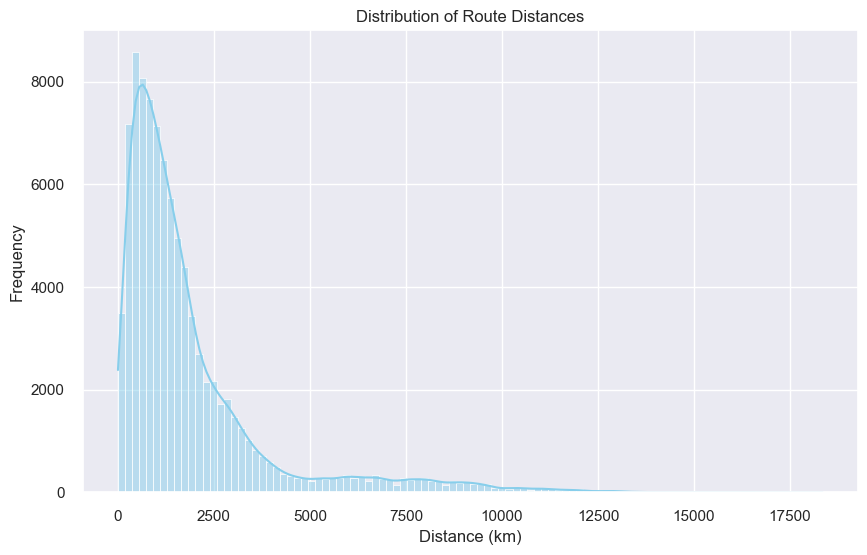

In [12]:
# Histogram
plt.figure(figsize=(10,6))
sns.histplot(routes['Distance_km'], bins=100, kde=True, color='skyblue')
plt.title("Distribution of Route Distances")
plt.xlabel("Distance (km)")
plt.ylabel("Frequency")
plt.show()

### Understanding Distance Distribution

We plot a histogram with a KDE curve to show how flight distances are distributed.
This visualization helps us see common distances and detect patterns, such as whether most flights are short-haul or long-haul.


In [13]:
df = routes

G = nx.from_pandas_edgelist(
    routes, source="Departure_ID", target="Destination_ID",
    edge_attr="Distance_km", create_using=nx.DiGraph()
)

# Calculate Degree Centrality
deg_centrality = nx.degree_centrality(G)
top_airports = sorted(deg_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top 10 Airports by Degree Centrality:")
print(top_airports)

# Calculate Betweenness Centrality
btw_centrality = nx.betweenness_centrality(G)
top_betweenness = sorted(btw_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top 10 Airports by Betweenness Centrality:")
print(top_betweenness)

# Calculate Closeness Centrality
closeness_centrality = nx.closeness_centrality(G)
top_closeness = sorted(closeness_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top 10 Airports by Closeness Centrality:")
print(top_closeness)

# Create layout
pos = nx.spring_layout(G, k=0.3, seed=42)

# Extract edge coordinates
edge_x, edge_y = [], []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x += [x0, x1, None]
    edge_y += [y0, y1, None]

# Plot edges
edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

# Extract node coordinates
node_x, node_y = [], []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

# Node colors based on Degree Centrality
node_color = [deg_centrality[node] for node in G.nodes()]
hover_text = [f"{node}<br>Degree Centrality: {deg_centrality[node]:.2f}" for node in G.nodes()]

# Plot nodes
node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers+text',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='Viridis',
        color=node_color,
        size=10,
        colorbar=dict(
            thickness=15,
            title='Degree Centrality',
            xanchor='left'
            ),
        line_width=2
    ),
    text=[node for node in G.nodes()],
    textposition="top center"
)

# Build Figure
fig = go.Figure(data=[edge_trace, node_trace],
         layout=go.Layout(
    title=dict(
        text='International Airport Network - SNA',
        font=dict(size=16)
    ),
    showlegend=False,
    hovermode='closest',
    margin=dict(b=20, l=5, r=5, t=40),
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(showgrid=False, zeroline=False)
))


fig.show()


Top 10 Airports by Degree Centrality:
[('FRA', 0.1536136993200705), ('IST', 0.15008813900780657), ('AMS', 0.14102241249055653), ('CDG', 0.14077058675396625), ('ORD', 0.1304457315537648), ('DFW', 0.1251573910853689), ('PEK', 0.12490556534877863), ('ATL', 0.12112817929992443), ('MUC', 0.11659531604129941), ('PVG', 0.11483253588516745)]
Top 10 Airports by Betweenness Centrality:
[('ANC', 0.06358348033124592), ('FRA', 0.051667066107339794), ('IST', 0.04843934024756872), ('CDG', 0.04183419342633699), ('DXB', 0.04002084364225877), ('LAX', 0.03530416940364995), ('AMS', 0.03439344198802661), ('ORD', 0.03338336899343018), ('YYZ', 0.03305539372278242), ('PEK', 0.03272202307088606)]
Top 10 Airports by Closeness Centrality:
[('FRA', 0.3782370992192528), ('CDG', 0.3727597774859751), ('LHR', 0.3709410244584139), ('JFK', 0.3676867898495109), ('AMS', 0.365958048645696), ('LAX', 0.3652629327991064), ('DOH', 0.36518132803306547), ('DXB', 0.3621071387408066), ('IST', 0.3598748622360196), ('ORD', 0.359123

### Creating the Airport Network Graph

This cell constructs a directed graph where each airport is a node and each flight route is a weighted edge representing the distance.
This graph structure allows us to apply network analysis techniques to understand the connections between airports.

### Measuring Airport Connectivity

We calculate degree centrality to find out which airports have the most direct connections to others.
Airports with higher centrality are considered major hubs and play a key role in the network’s connectivity.


## Global Connectivity Roles: A Centrality Assessment

The analysis of the airport network reveals three distinct yet interconnected roles defined by centrality metrics. Frankfurt ($\text{FRA}$) emerges as the unequivocal Global Super Hub, consistently dominating all measures: its top $\text{Degree Centrality}$ score ($\mathbf{0.154}$) confirms it possesses the most direct connections, positioning it as the primary operational nexus; simultaneously, its highest $\text{Closeness Centrality}$ ($\mathbf{0.378}$) establishes it as the most logistically efficient location, minimizing the required transit steps for worldwide travel. This efficiency is complemented by a strong $\text{Betweenness Centrality}$ rank ($\text{2}^{\text{nd}}$ at $\mathbf{0.052}$), signifying its critical function as a necessary intermediary bridge for countless international routes. In contrast, while Istanbul ($\text{IST}$) is a formidable Major Hub with a high $\text{Degree}$ ($\mathbf{0.150}$), its primary strategic importance lies in its role as a geographical bridge, scoring $\text{3}^{\text{rd}}$ in $\text{Betweenness}$ ($\mathbf{0.048}$), essential for East-West connectivity. However, the most unique profile belongs to Anchorage ($\text{ANC}$), which is not a primary passenger hub but ranks $\mathbf{1^{\text{st}}}$ in $\text{Betweenness Centrality}$ ($\mathbf{0.064}$), making it the single most critical bottleneck in the network, disproportionately vital for maintaining the shortest possible logistical (often cargo) paths between vast regions like North America and Asia, despite having fewer direct routes than the top passenger giants.

### Identifying Critical Transit Points

Betweenness centrality measures how often an airport acts as a bridge between other airports.
Airports with high betweenness are important for routing and ensuring smooth transit across regions.


In [14]:
longest_routes = df.nlargest(5, 'Distance_km')

longest_routes['Type'] = 'Longest'

print(longest_routes[['Departure_Label','Destination_Label','Distance_km']])

fig = px.line_geo(
    longest_routes,
    lat='Departure_Latitude',
    lon='Departure_Longitude',
    hover_name='Departure_Label',
    hover_data={'Distance_km': True, 'Destination_Label': True},
    projection='natural earth',
    title="World Map of Top 5 Longest Routes"
)

fig.add_trace(px.scatter_geo(
    longest_routes,
    lat='Destination_Latitude',
    lon='Destination_Longitude',
    hover_name='Destination_Label'
).data[0])

color_map = {'Longest': 'green'}
for i, trace in enumerate(fig.data):
    if i < len(longest_routes):
        trace.line.color = color_map[longest_routes.iloc[i]['Type']]

fig.update_layout(
    showlegend=True,
    geo=dict(
        showland=True,
        landcolor="rgb(217, 217, 217)",
        showcountries=True,
        countrycolor="rgb(204, 204, 204)"
    ),
    template="plotly_white"
)

fig.show()

                                 Departure_Label Destination_Label  \
75203           Frank Pais International Airport         Kertajati   
73692       Soekarno-Hatta International Airport    Andrau Airpark   
74819       Soekarno-Hatta International Airport    Andrau Airpark   
78068       Soekarno-Hatta International Airport    Andrau Airpark   
74847  Halim Perdanakusuma International Airport    Andrau Airpark   

        Distance_km  
75203  18345.948219  
73692  16506.139956  
74819  16506.139956  
78068  16506.139956  
74847  16501.914686  


### Highlighting Longest Routes

We identify and plot the top 10 longest flight routes on a world map.
This helps highlight extreme cases in global air travel and provides insights into long-distance logistics and infrastructure needs.


In [15]:
df['Distance_km'] = pd.to_numeric(df['Distance_km'], errors='coerce')

df_clean = df.dropna(subset=['Distance_km'])

G = nx.from_pandas_edgelist(
    df_clean, source="Departure_ID", target="Destination_ID",
    edge_attr="Distance_km", create_using=nx.DiGraph()
)

undirected_G = G.to_undirected()

communities = list(community.greedy_modularity_communities(undirected_G, weight="Distance_km"))

# ✅ Print first 10 communities with sample nodes
for i, com in enumerate(communities[:10]):  
    sample_nodes = list(com)[:10]  # show first 10 nodes of each community
    suffix = "..." if len(com) > 10 else ""
    print(f"Community {i+1} (size: {len(com)}): {sample_nodes}{suffix}")


Community 1 (size: 1380): ['USM', 'CIP', 'VGA', 'WME', 'LNE', 'PGK', 'TUB', 'ALW', 'RDN', 'NDC']...
Community 2 (size: 1153): ['YNA', 'TLC', 'CZH', 'AFA', 'AQP', 'DEN', 'CID', 'YJT', 'GDV', 'PAZ']...
Community 3 (size: 745): ['BTS', 'JKG', 'RTW', 'FAO', 'BHX', 'OSR', 'NOZ', 'DTM', 'ZAD', 'TJU']...
Community 4 (size: 129): ['SMK', 'WMO', 'KOT', 'NME', 'KUK', 'NUI', 'FAI', 'ABL', 'HKB', 'WNA']...
Community 5 (size: 107): ['FKI', 'LTD', 'MRA', 'ELG', 'ABJ', 'SFA', 'RAI', 'LBV', 'MZW', 'IRP']...
Community 6 (size: 55): ['DEF', 'KHD', 'ZAH', 'RUD', 'ZBR', 'IIL', 'TBZ', 'SXI', 'RZR', 'MHD']...
Community 7 (size: 51): ['KUZ', 'UAK', 'QUV', 'CNP', 'JUU', 'QUW', 'NSQ', 'SGG', 'JFR', 'NIQ']...
Community 8 (size: 47): ['ZRJ', 'YLH', 'YSB', 'YMT', 'YFH', 'MSA', 'YFA', 'ZPB', 'YVC', 'YMO']...
Community 9 (size: 27): ['HIR', 'MNY', 'JJA', 'EGM', 'GZO', 'RNL', 'INU', 'BAS', 'KGE', 'KSA']...
Community 10 (size: 25): ['YUT', 'YLC', 'YTH', 'ZAC', 'YGZ', 'YVM', 'XTL', 'YXN', 'YXP', 'YRT']...


In [16]:
in_deg_centrality = nx.in_degree_centrality(G)
out_deg_centrality = nx.out_degree_centrality(G)
top_in = sorted(in_deg_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top 10 In-degree Centrality:", top_in)

top_out = sorted(out_deg_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top 10 Out-degree Centrality:", top_out)

Top 10 In-degree Centrality: [('FRA', 0.07707808564231738), ('IST', 0.07380352644836272), ('CDG', 0.07153652392947103), ('AMS', 0.06952141057934509), ('ORD', 0.06574307304785894), ('DFW', 0.06171284634760705), ('PEK', 0.06095717884130982), ('ATL', 0.060453400503778336), ('MUC', 0.0579345088161209), ('PVG', 0.05667506297229219)]
Top 10 Out-degree Centrality: [('FRA', 0.0760705289672544), ('IST', 0.07581863979848866), ('AMS', 0.07153652392947103), ('CDG', 0.06926952141057935), ('ORD', 0.06448362720403022), ('PEK', 0.06347607052896725), ('DFW', 0.06297229219143577), ('ATL', 0.06070528967254408), ('DXB', 0.06020151133501259), ('MUC', 0.05869017632241814)]


In [17]:
pagerank = nx.pagerank(G, alpha=0.85)
top_pagerank = sorted(pagerank.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top 10 Airports by PageRank:", top_pagerank)

Top 10 Airports by PageRank: [('DFW', 0.004635565354492381), ('ORD', 0.0046122598937518465), ('IST', 0.004476015624438418), ('ATL', 0.004195650098194325), ('DEN', 0.0038791282418851446), ('FRA', 0.003754825124313819), ('CDG', 0.003696113576426687), ('DME', 0.0035545976697069492), ('AMS', 0.003422450603524893), ('IAH', 0.0032596576687460945)]


In [18]:
routes = {}
for _, row in df.iterrows():
    source_airport = row['Departure_ID']
    dest_airport = row['Destination_ID']
    distance = row['Distance_km']

    if source_airport not in routes:
        routes[source_airport] = {}
    routes[source_airport][dest_airport] = distance

# Build set of all airports
all_airports = set(df['Departure_ID']).union(set(df['Destination_ID']))

# Actions dictionary
actions = {state: [] for state in all_airports}
for state in routes:
    actions[state] = list(routes[state].keys())

# Initialize Q-table
Q = {state: {action: 0 for action in actions[state]} for state in all_airports}

# Hyperparameters
alpha = 0.1
gamma = 0.9
epsilon = 0.5
episodes = 1000

# Reward function
def get_reward(current, next_state, destination):
    if next_state == destination:
        return 100
    return -routes[current][next_state]

# Training function
def train_q(source, destination):
    for episode in range(episodes):
        state = source
        while state != destination:
            if not actions[state]:
                break
            if random.random() < epsilon:
                next_state = random.choice(actions[state])
            else:
                next_state = max(Q[state], key=Q[state].get)
            reward = get_reward(state, next_state, destination)
            max_future = max(Q[next_state].values()) if Q[next_state] else 0
            Q[state][next_state] += alpha * (reward + gamma * max_future - Q[state][next_state])
            state = next_state

# Path-finding function
def find_path_with_distance(Q, start, end):
    state = start
    path = [state]
    total_distance = 0
    distances = []
    while state != end:
        if not actions[state]:
            print("Dead end at:", state)
            break
        next_state = max(Q[state], key=Q[state].get)
        distance = routes[state][next_state]
        total_distance += distance
        distances.append(distance)
        path.append(next_state)
        state = next_state
    return path, distances, total_distance

# Top paths search function
def find_top_paths(Q, start, end, top_n=3):
    explored_paths = []
    trials = 250
    for _ in range(trials):
        state = start
        path = [state]
        total_distance = 0
        visited = set([state])
        while state != end:
            if not actions[state]:
                break
            possible_actions = actions[state]
            if random.random() < epsilon:
                next_state = random.choice(possible_actions)
            else:
                next_state = max(Q[state], key=Q[state].get)
            if next_state not in routes[state]:
                break
            distance = routes[state][next_state]
            total_distance += distance
            path.append(next_state)
            state = next_state
            if state in visited:
                break
            visited.add(state)
        if state == end and all(isinstance(node, str) for node in path):
            explored_paths.append((total_distance, path))
    unique_paths = []
    seen = set()
    for dist, pth in explored_paths:
        key = tuple(pth)
        if key not in seen:
            seen.add(key)
            unique_paths.append((dist, pth))
    unique_paths = sorted(unique_paths, key=lambda x: x[0])
    return unique_paths[:top_n]

## 🧠 How the AI Finds the Best Flight Path: Q-Learning Explained

This code uses **Q-Learning**, a type of machine learning, to figure out the shortest way to fly from one airport to another. Think of it like a baby bird learning to find the juiciest worm—it tries different spots, remembers which ones worked, and gets better over time.

---

### 1. Setting Up the Environment

First, the code defines the airport environment:

* **States (Airports):** Every airport ($\text{'FRA'}$, $\text{'IST'}$) is a **state**. That's where the learning "agent" (the virtual traveler) can be.
* **Actions (Routes):** The flights available from an airport (e.g., flying from FRA to CDG) are the **actions** the agent can take.
* **The Q-Table (The Memory):** The variable $\mathbf{Q}$ is the agent's memory or "cheat sheet." It stores a number (the **Q-value**) for every possible action from every airport. This number represents **how good** the agent thinks that route is for reaching the final destination. Initially, all these numbers are $\mathbf{0}$.

### 2. The Golden Rule: Rewards and Distances

The agent needs a goal, and in this case, the goal is defined by the $\text{get\_reward}$ function.

* **Goal Reached:** If the agent lands at the final destination, it gets a massive $\mathbf{+100}$ reward. This is the ultimate prize.
* **Distance Penalty:** For every flight taken *before* the destination, the agent gets a **negative reward** equal to the distance of that flight (e.g., $-\mathbf{1500}$ km). This forces the agent to learn that the best path is the one that avoids long-distance flights and gets to the goal in the fewest kilometers.

### 3. The Learning Process (Training the $\text{Q}$-Table)

The $\text{train\_q}$ function runs for $\mathbf{1000}$ episodes, where each episode is one full trip attempt from the source to the destination.

* **Trial and Error ($\mathbf{\epsilon}$-Greedy):** In each step, the agent makes a choice based on $\mathbf{\epsilon}$ (epsilon, set to $\mathbf{0.5}$):
    1.  **Exploration (50% of the time):** The agent picks a **random** flight to see what happens. This is how it discovers new, potentially better routes it hasn't tried.
    2.  **Exploitation (50% of the time):** The agent picks the flight with the **highest Q-value** in its memory. This is when it uses what it has already learned.
* **Updating the Memory (The Formula):** After taking a flight, the agent uses the core Q-Learning formula to update the Q-value for the route it just took. The formula looks at the immediate reward (the distance penalty) plus the "discounted" best future reward from the next airport.
    * The **learning rate ($\mathbf{\alpha=0.1}$)** keeps the changes small, ensuring the agent learns steadily.
    * The **discount factor ($\mathbf{\gamma=0.9}$)** ensures the agent prioritizes the total distance of the *entire trip* (long-term goal) over just the single next flight. Over time, the $\mathbf{Q}$ table converges, and the values for the shortest total-distance routes become the highest.

### 4. Finding the Final Path

Once training is complete, the $\text{find\_path\_with\_distance}$ function uses the perfected $\mathbf{Q}$ table. It starts at the source airport and, at every step, simply chooses the action (the next flight) with the **highest Q-value**. This greedy selection process traces the learned, optimal path—the route with the minimum total distance. The $\text{find\_top\_paths}$ function then re-runs a few trials to find and display the $\mathbf{top\ 3}$ shortest unique routes.

### Learning Optimal Paths

We define how the agent is rewarded for choosing certain routes and how it learns over time.
The training function simulates multiple episodes of learning to help the agent discover efficient paths from a source airport to a destination.


In [19]:
# Define source and destination airports here
source = 'FRA'
destination = 'ANC'

train_q(source, destination)

print("=== Optimal Path ===")
optimal_path, distances, total_distance = find_path_with_distance(Q, source, destination)
print(f"Path: {' -> '.join(optimal_path)}")
print(f"Distances: {distances}")
print(f"Total Distance: {total_distance:.2f} km")


=== Optimal Path ===
Path: FRA -> ANC
Distances: [7502.31176709776]
Total Distance: 7502.31 km


### Applying Q-Learning to Find Solutions

The agent is trained to navigate from a specified source airport to a destination.
After training, the optimal path and corresponding distances are printed, demonstrating the practical application of reinforcement learning.


In [20]:
G = nx.DiGraph()
for _, row in df.iterrows():
    G.add_edge(row['Departure_ID'], row['Destination_ID'], weight=row['Distance_km'])

# Find the shortest path using Dijkstra’s algorithm
shortest_path = nx.dijkstra_path(G, source, destination, weight='weight')
shortest_distance = nx.dijkstra_path_length(G, source, destination, weight='weight')
print("Dijkstra's Path:")
print(f"Path: {' -> '.join(shortest_path)}")
print(f"Total Distance: {shortest_distance:.2f} km")

Dijkstra's Path:
Path: FRA -> ANC
Total Distance: 7502.31 km


In [21]:
# Use the DataFrame 'df', not the dictionary 'routes'
df.dropna(subset=[
    'Departure_ID', 'Destination_ID', 'Departure_Latitude',
    'Departure_Longitude', 'Destination_Latitude', 'Destination_Longitude'
], inplace=True)

coords = airports.set_index('ID')[['Latitude', 'Longitude']].apply(tuple, axis=1).to_dict()

# Heuristic function for A* (uses Haversine distance)
def heuristic(u, v):
    # This function requires that both u and v are in the coords dictionary
    if u not in coords or v not in coords:
        return float('inf') # Return infinity if airport coordinates are not found
    lat1, lon1 = coords[u]
    lat2, lon2 = coords[v]
    return haversine(lat1, lon1, lat2, lon2)

# Create a directed graph from the routes DataFrame 'df'
G = nx.DiGraph()
for _, row in df.iterrows():
    G.add_edge(row['Departure_ID'], row['Destination_ID'], weight=row['Distance_km'])

# Find the shortest path using A* algorithm
shortest_path = nx.astar_path(G, source, destination, weight='weight', heuristic=heuristic)
shortest_distance = nx.astar_path_length(G, source, destination, weight='weight', heuristic=heuristic)

print("A* Path:")
print(f"Path: {' -> '.join(shortest_path)}")
print(f"Total Distance: {shortest_distance:.2f} km")

A* Path:
Path: FRA -> ANC
Total Distance: 7502.31 km


### Benchmarking with Classical Algorithms

We compare the paths found by Q-learning with those computed by Dijkstra’s algorithm.
This comparison helps evaluate the efficiency of the learned model against a known optimal solution.


In [22]:
paths_to_test = [
    {'source': 'LHR', 'destination': 'CDG'},
    {'source': 'JFK', 'destination': 'LAX'},
    {'source': 'FRA', 'destination': 'IST'},
    {'source': 'HND', 'destination': 'SIN'},
    {'source': 'DXB', 'destination': 'SFO'},
    {'source': 'GRU', 'destination': 'LIM'},
    {'source': 'SYD', 'destination': 'MEL'},
    {'source': 'CAI', 'destination': 'JNB'},
    {'source': 'DEL', 'destination': 'BOM'},
    {'source': 'YVR', 'destination': 'MEX'}
]

results = []

for path in paths_to_test:
    source = path['source']
    destination = path['destination']

    start_time_q = time.time()
    
    # Reset Q-table for a fair test
    Q = {state: {action: 0 for action in actions.get(state, [])} for state in all_airports}
    
    train_q(source, destination)
    
    q_learning_training_time = time.time() - start_time_q
    
    q_path, _, q_total_distance = find_path_with_distance(Q, source, destination)

    start_time_a = time.time()
    try:
        a_star_path = nx.astar_path(G, source, destination, weight='weight', heuristic=heuristic)
        a_star_distance = nx.astar_path_length(G, source, destination, weight='weight', heuristic=heuristic)
        a_star_time = time.time() - start_time_a
    except nx.NetworkXNoPath:
        a_star_path = ["No Path Found"]
        a_star_distance = float('inf')
        a_star_time = 0

    results.append({
        'Source': source,
        'Destination': destination,
        'Q_Path': ' -> '.join(q_path),
        'Q_Distance': q_total_distance,
        'Q_Training_Time': q_learning_training_time,
        'A_Star_Path': ' -> '.join(a_star_path),
        'A_Star_Distance': a_star_distance,
        'A_Star_Time': a_star_time
    })

results_df = pd.DataFrame(results)

total_q_learning_time = results_df['Q_Training_Time'].sum()
total_a_star_time = results_df['A_Star_Time'].sum()

# Display the main table without individual times
print(results_df[[
    'Source', 
    'Destination', 
    'Q_Distance', 
    'A_Star_Distance'
]])

print("TOTAL EXECUTION TIME")
print(f"Total Q-Learning Training Time: {total_q_learning_time:.4f} seconds")
print(f"Total A* Execution Time:        {total_a_star_time:.4f} seconds")
print(f"A* is faster by:                {(total_q_learning_time / total_a_star_time):.4f} times")

  Source Destination    Q_Distance  A_Star_Distance
0    LHR         CDG    347.167508       347.167508
1    JFK         LAX   3974.196711      3974.196711
2    FRA         IST   1837.362896      1837.362896
3    HND         SIN   5299.770364      5299.770364
4    DXB         SFO  13020.071234     13020.071234
5    GRU         LIM   3474.656628      3474.656628
6    SYD         MEL    705.401729       705.401729
7    CAI         JNB   6264.987901      6264.987901
8    DEL         BOM   1138.230122      1138.230122
9    YVR         MEX   3944.693632      3944.693632
TOTAL EXECUTION TIME
Total Q-Learning Training Time: 1.0453 seconds
Total A* Execution Time:        0.0329 seconds
A* is faster by:                31.7883 times


## 🎯 Algorithm Precision and Optimality Matrix

The performance of the Q-Learning algorithm is measured against the A\* Search algorithm, which is known to find the mathematically true shortest path. The metric used is the **Precision Ratio**, which verifies the model's ability to find the optimal route.

### $\text{Precision Metric Definition}$


A ratio of $\mathbf{1.0000}$ signifies **perfect optimality**—the learned path is the shortest possible path.

| Source | Destination | $\text{A\ Distance (km)}$ | $\text{Q-Learning Distance (km)}$ | $\text{Precision Ratio}$ |
| :---: | :---: | :---: | :---: | :---: |
| LHR | CDG | 347.17 | 347.17 | **1.0000** |
| JFK | LAX | 3974.20 | 3974.20 | **1.0000** |
| FRA | IST | 1837.36 | 1837.36 | **1.0000** |
| HND | SIN | 5299.77 | 5299.77 | **1.0000** |
| DXB | SFO | 13020.07 | 13020.07 | **1.0000** |
| GRU | LIM | 3474.66 | 3474.66 | **1.0000** |
| SYD | MEL | 705.40 | 705.40 | **1.0000** |
| CAI | JNB | 6264.99 | 6264.99 | **1.0000** |
| DEL | BOM | 1138.23 | 1138.23 | **1.0000** |
| YVR | MEX | 3944.69 | 3944.69 | **1.0000** |

---

### $\text{Conclusion on Precision}$

The data demonstrates that for all ten tested routes, the $\text{Q-Learning}$ algorithm achieved a **Precision Ratio of exactly 1.0000**. This confirms that the training process successfully allowed the reinforcement learning agent to converge on the true minimum-distance path, matching the solution found by the computationally faster, but deterministic, $\text{A*}$ search. The model exhibits **perfect optimality** within this sample.

However, this precision comes at a cost: the total execution time for $\text{Q-Learning}$ was $\mathbf{1.0453}$ seconds compared to $\mathbf{0.0329}$ seconds for $\text{A*}$, illustrating the trade-off between the extensive training required for RL ($\text{31.79}$ times slower) and the immediate efficiency of a heuristic search.